# OCB Modeling Part 2: The models
In this part of modeling the OCB boundary, we will take in data from the dayside and combine it with the nightside, creating unified source of boundary data, and conduct data analysis on it with different types of modeling methods, to eventually find a model which delivers us the best results, and to learn a few things in the meantime. 

Author: Arnav Singh

### Imports and adding the data
Here we take the data from last week, and use it to add dayside, MTd, and Activity Indices columns Also One-hot encoding the nightside vs. dayside data


In [88]:
import pandas as pd
import numpy as np

pre_df = pd.read_csv('alldata.csv')
pre_df['Nightside'] = 1
pre_df['Dayside'] = 0

# From Sotirelis (2000), is it MLT B2I?
pre_df['MTd'] = abs(pre_df['MagLat_B2I']) - 4.31 * (1 - np.cos(np.pi * (pre_df["MLT_B2I"] - 23.4) / 12))

## Binning each activity indices:
bins = [59, 62, 64, 66, 68, 71]
labels = [5, 4, 3, 2, 1]

# Classify MTd values
pre_df['Activity Bins'] = pd.cut(pre_df['MTd'], bins=bins, labels=labels, right=False)

pre_df.head(15)
#pre_df.describe()

,Date_UTC,MagLat_OCB,MLT_OCB,MagLat_B2I,MLT_B2I,"1AU_IP_BX,_GSE","1AU_IP_BY,_GSE","1AU_IP_BZ,_GSE",1AU_IP_PLASMA_SPEED,3-H_KP*10,1-H_DST,1-H_AE,1-H_AL-INDEX,AU-INDEX,PROTON_QI,Nightside,Dayside,MTd,Activity Bins
0,1983-12-01 00:19:30,76.39,4.01,65.21,0.40,999.9,999.9,999.9,9999.0,33.0,-17.0,206.0,-126.0,79.0,9.9999,1,0,65.063140,3
1,1983-12-01 00:30:42,-78.71,18.37,-67.17,18.26,999.9,999.9,999.9,9999.0,33.0,-17.0,206.0,-126.0,79.0,9.9999,1,0,63.822208,4
2,1983-12-01 00:38:35,-75.03,5.90,-69.69,5.97,999.9,999.9,999.9,9999.0,33.0,-17.0,206.0,-126.0,79.0,9.9999,1,0,64.739222,3
3,1983-12-01 01:09:11,-73.41,19.42,-65.60,20.31,999.9,999.9,999.9,9999.0,33.0,-19.0,309.0,-178.0,130.0,9.9999,1,0,64.264983,3
4,1983-12-01 01:20:21,78.50,4.38,67.15,5.15,999.9,999.9,999.9,9999.0,33.0,-19.0,309.0,-178.0,130.0,9.9999,1,0,63.121887,4
5,1983-12-01 01:28:52,73.51,18.94,65.74,18.58,999.9,999.9,999.9,9999.0,33.0,-19.0,309.0,-178.0,130.0,9.9999,1,0,62.740382,4
6,1983-12-01 02:10:01,-75.96,19.53,-65.79,18.99,999.9,999.9,999.9,9999.0,33.0,-21.0,293.0,-139.0,154.0,9.9999,1,0,63.222721,4
7,1983-12-01 02:17:30,-77.62,4.77,-67.25,5.56,999.9,999.9,999.9,9999.0,33.0,-21.0,293.0,-139.0,154.0,9.9999,1,0,62.759516,4
8,1983-12-01 02:50:51,-77.63,20.83,-65.39,21.54,999.9,999.9,999.9,9999.0,33.0,-21.0,293.0,-139.0,154.0,9.9999,1,0,64.889030,3
9,1983-12-01 03:01:56,81.89,5.33,69.25,5.68,999.9,999.9,999.9,9999.0,33.0,-20.0,205.0,-82.0,121.0,9.9999,1,0,64.624343,3


### Reading Dayside Data
From Tom Sotirelis, the dayside data is recent up until 2012.

In [29]:
import os
from datetime import datetime
import pandas as pd

# Define folder paths
folder_paths = ["dayside"]

# Function to convert date columns to datetime
def convert_to_datetime(df, year):
    date_columns = ['EQB_Date', 'SUB_Date', 'OCB_Date']
    for col in date_columns:
        df[col] = pd.to_timedelta(df[col], unit='s') + pd.Timestamp(year)
    return df

# List to accumulate DataFrames
all_dataframes = []

for folder_path in folder_paths:
    files = os.listdir(folder_path)
    
    for file_name in files:
        if file_name.startswith("d_") and file_name.endswith(".txt"):
            year_str = file_name.split("_")[1].split(".")[0]
            
            if year_str.isdigit():
                year = datetime(int(year_str), 1, 1)
                
                # Read the file using whitespace as a delimiter
                file_path = os.path.join(folder_path, file_name)
                dayside_df = pd.read_csv(
                    file_path,  # Correct file path usage
                    delim_whitespace=True,  # Use any whitespace as a delimiter
                    low_memory=False,
                    names=['EQB_Date', 'EQB_glat', 'EQB_glon', 'EQB_mlat', 'EQB_mlon', 'EQB_mlt', 'sc1', 
                        'SUB_Date', 'SUB_glat', 'SUB_glon', 'SUB_mlat', 'SUB_mlon', 'SUB_mlt', 'sc2',
                        'OCB_Date', 'OCB_glat', 'OCB_glon', 'OCB_mlat', 'OCB_mlon', 'OCB_mlt', 'sc3'
                    ]
                )

                # Convert the date columns to datetime
                dayside_df = convert_to_datetime(dayside_df, year)

                # Append the DataFrame to the list
                all_dataframes.append(dayside_df)

# Concatenate all DataFrames into a single DataFrame
combined_dayside_df = pd.concat(all_dataframes, ignore_index=True)

combined_dayside_df.sort_values(by = 'EQB_Date', inplace = True)
combined_dayside_df['Dayside']=1
combined_dayside_df.describe()

,EQB_Date,EQB_glat,EQB_glon,EQB_mlat,EQB_mlon,EQB_mlt,sc1,SUB_Date,SUB_glat,SUB_glon,...,SUB_mlt,sc2,OCB_Date,OCB_glat,OCB_glon,OCB_mlat,OCB_mlon,OCB_mlt,sc3,Dayside
count,631219,631219.000000,631219.000000,631219.000000,631219.000000,631219.000000,631219.000000,631219,631219.000000,631219.000000,...,631219.000000,631219.000000,631219,631219.000000,631219.000000,631219.000000,631219.000000,631219.000000,631219.000000,631219.0
mean,2000-09-22 06:25:29.615132288,5.745049,118.062761,5.224109,-8.692862,7.560731,12.902218,2000-10-03 20:16:05.524951040,4.716075,125.773612,...,8.438406,12.902218,2000-10-31 11:45:18.831916928,5.003322,158.737878,4.075263,-4.473903,10.377233,12.902218,1.0
min,1982-12-31 23:59:59,-81.450000,0.000000,-87.920000,-180.000000,0.000000,6.000000,1982-12-31 23:59:59,-81.520000,0.000000,...,0.000000,6.000000,1982-12-31 23:59:59,-81.520000,0.000000,-89.830000,-180.000000,0.000000,6.000000,1.0
25%,1994-12-31 23:59:59,-51.580000,0.000000,-62.070000,-66.350000,0.000000,11.000000,1994-12-31 23:59:59,-60.300000,0.000000,...,0.000000,11.000000,1995-01-05 20:57:25,-71.840000,77.660000,-77.170000,-81.540000,6.460000,11.000000,1.0
50%,2001-12-31 23:59:59,0.000000,106.730000,0.000000,0.000000,7.160000,13.000000,2001-12-31 23:59:59,0.000000,123.520000,...,7.910000,13.000000,2001-12-31 23:59:59,0.000000,163.320000,0.000000,0.000000,9.650000,13.000000,1.0
75%,2006-12-31 23:59:59,62.030000,210.640000,65.060000,30.130000,10.420000,15.000000,2007-02-04 22:26:03.500000,68.530000,210.370000,...,13.600000,15.000000,2007-04-09 23:05:38,76.220000,232.540000,77.430000,69.380000,15.960000,15.000000,1.0
max,2012-12-31 23:27:06,81.520000,360.000000,87.380000,180.000000,23.910000,18.000000,2012-12-31 23:24:08,81.520000,360.000000,...,23.910000,18.000000,2012-12-31 23:22:24,81.520000,360.000000,89.900000,180.000000,23.970000,18.000000,1.0
std,NaN,52.681822,111.279379,54.521206,86.603911,6.592322,3.204782,NaN,60.011571,108.036961,...,6.500874,3.204782,NaN,70.502675,101.655735,73.572601,92.370944,5.757561,3.204782,0.0


Now that we have all the dayside data, let's see what it looks like, specifically for OCB

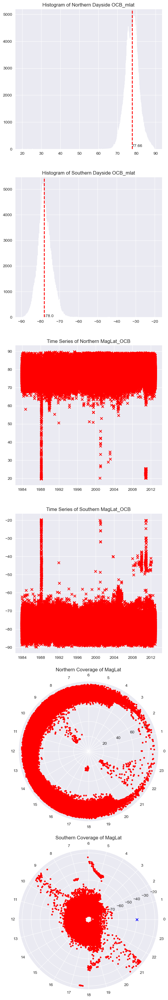

In [12]:
import matplotlib.pyplot as plt
import numpy as np

#### Conditoins imposed
North = combined_dayside_df["OCB_mlat"] > 0
South = combined_dayside_df["OCB_mlat"] < 0

## Data extraction
northern_dayside_df = combined_dayside_df[North]
southern_dayside_df = combined_dayside_df[South]

X = northern_dayside_df["OCB_mlat"].values
X1 = southern_dayside_df["OCB_mlat"].values
Date_N = northern_dayside_df["OCB_Date"]
Date_S = southern_dayside_df["OCB_Date"]
OCB_mlt_N = (northern_dayside_df['OCB_mlt']/12 * np.pi)
OCB_mlt_S = (southern_dayside_df['OCB_mlt']/12 * np.pi)

median = np.median(X)
plt.subplot(6,1,1)
plt.title("Histogram of Northern Dayside OCB_mlat")
plt.hist(X, bins='auto')
plt.axvline(median, color='red', linestyle='dashed', linewidth=2, label='Median')
plt.annotate(str(median), xy=(median, median))

median1 = np.median(X1)
plt.subplot(6,1,2)
plt.title("Histogram of Southern Dayside OCB_mlat")
plt.hist(X1, bins='auto')
plt.axvline(median1, color='red', linestyle='dashed', linewidth=2, label='Median')
plt.annotate(str(median1), xy=(median1, 2))

plt.subplot(6,1,3)
plt.scatter(Date_N, X, marker='x', color='red')
plt.title('Time Series of Northern MagLat_OCB')

plt.subplot(6,1,4)
plt.scatter(Date_S, X1, marker='x', color='red')
plt.title('Time Series of Southern MagLat_OCB')

plt.subplot(6,1,5, polar=True)
plt.scatter(OCB_mlt_N, X, marker='.', color='red')
# Customize labels
angles = np.linspace(0, 2*np.pi, 24, endpoint=False)
labels = [t for t in range(0,24)]
plt.xticks(angles, labels)
plt.title('Northern Coverage of MagLat')

plt.subplot(6,1,6, polar=True)
plt.scatter(OCB_mlt_S, X1, marker='.', color='red')
plt.scatter(2*np.pi, -40, marker='x', color='blue')
# Customize labels
angles = np.linspace(0, 2*np.pi, 24, endpoint=False)
labels = [t for t in range(0,24)]
plt.xticks(angles, labels)
plt.title('Southern Coverage of MagLat')

plt.subplots_adjust(wspace=1, bottom = -6)

Plots work, can see that there is some nightside coverage as well with this data.

### Loading in new GSM data

In [70]:
GSM_df = pd.read_csv("data/OMNI2_H0_MRG1HR_1794830.csv", comment='#')

GSM_df['TIME_AT_CENTER_OF_HOUR_yyyy-mm-ddThh:mm:ss.sssZ'] = pd.to_datetime(GSM_df['TIME_AT_CENTER_OF_HOUR_yyyy-mm-ddThh:mm:ss.sssZ'], format='%Y-%m-%dT%H:%M:%S.%fZ')
GSM_df.rename(columns={'TIME_AT_CENTER_OF_HOUR_yyyy-mm-ddThh:mm:ss.sssZ': 'Date_UTC'}, inplace=True)
GSM_df.head(10)
#GSM_df.describe()

,Date_UTC,1AU_IP_BY__GSM_nT,1AU_IP_BZ__GSM_nT
0,1983-12-01 00:30:00,999.9,999.9
1,1983-12-01 01:30:00,999.9,999.9
2,1983-12-01 02:30:00,999.9,999.9
3,1983-12-01 03:30:00,999.9,999.9
4,1983-12-01 04:30:00,999.9,999.9
5,1983-12-01 05:30:00,999.9,999.9
6,1983-12-01 06:30:00,999.9,999.9
7,1983-12-01 07:30:00,999.9,999.9
8,1983-12-01 08:30:00,999.9,999.9
9,1983-12-01 09:30:00,999.9,999.9


### Merging GSM and alldata
We have to merge both the GSM and alldata csvs

In [25]:
tolerance = pd.Timedelta(minutes=30)
pre_df.reset_index(inplace=True)
pre_df['Date_UTC'] = pd.to_datetime(pre_df['Date_UTC'])
pre_df.set_index('Date_UTC', inplace=True)
GSM_df.set_index('Date_UTC', inplace=True)

merged1_df = pd.merge_asof(
    pre_df.sort_index(),
    GSM_df.sort_index(),
    left_index=True,
    right_index=True,
    tolerance=tolerance,
    direction='nearest'
)
# Reset index to see the Datetime column again
merged1_df.reset_index(inplace=True)
merged1_df.head(10)

,Date_UTC,MagLat_OCB,MLT_OCB,MagLat_B2I,MLT_B2I,"1AU_IP_BX,_GSE","1AU_IP_BY,_GSE","1AU_IP_BZ,_GSE",1AU_IP_PLASMA_SPEED,3-H_KP*10,...,1-H_AE,1-H_AL-INDEX,AU-INDEX,PROTON_QI,Nightside,Dayside,MTd,Activity Bins,1AU_IP_BY__GSM_nT,1AU_IP_BZ__GSM_nT
0,1983-12-01 00:19:30,76.39,4.01,65.21,0.40,999.9,999.9,999.9,9999.0,33.0,...,206.0,-126.0,79.0,9.9999,1,0,65.063140,3,999.9,999.9
1,1983-12-01 00:30:42,-78.71,18.37,-67.17,18.26,999.9,999.9,999.9,9999.0,33.0,...,206.0,-126.0,79.0,9.9999,1,0,63.822208,4,999.9,999.9
2,1983-12-01 00:38:35,-75.03,5.90,-69.69,5.97,999.9,999.9,999.9,9999.0,33.0,...,206.0,-126.0,79.0,9.9999,1,0,64.739222,3,999.9,999.9
3,1983-12-01 01:09:11,-73.41,19.42,-65.60,20.31,999.9,999.9,999.9,9999.0,33.0,...,309.0,-178.0,130.0,9.9999,1,0,64.264983,3,999.9,999.9
4,1983-12-01 01:20:21,78.50,4.38,67.15,5.15,999.9,999.9,999.9,9999.0,33.0,...,309.0,-178.0,130.0,9.9999,1,0,63.121887,4,999.9,999.9
5,1983-12-01 01:28:52,73.51,18.94,65.74,18.58,999.9,999.9,999.9,9999.0,33.0,...,309.0,-178.0,130.0,9.9999,1,0,62.740382,4,999.9,999.9
6,1983-12-01 02:10:01,-75.96,19.53,-65.79,18.99,999.9,999.9,999.9,9999.0,33.0,...,293.0,-139.0,154.0,9.9999,1,0,63.222721,4,999.9,999.9
7,1983-12-01 02:17:30,-77.62,4.77,-67.25,5.56,999.9,999.9,999.9,9999.0,33.0,...,293.0,-139.0,154.0,9.9999,1,0,62.759516,4,999.9,999.9
8,1983-12-01 02:50:51,-77.63,20.83,-65.39,21.54,999.9,999.9,999.9,9999.0,33.0,...,293.0,-139.0,154.0,9.9999,1,0,64.889030,3,999.9,999.9
9,1983-12-01 03:01:56,81.89,5.33,69.25,5.68,999.9,999.9,999.9,9999.0,33.0,...,205.0,-82.0,121.0,9.9999,1,0,64.624343,3,999.9,999.9


### Fix this
Adding dayside data as well into the dataframe, but in a bit for now


In [35]:
OCB_dayside_df = combined_dayside_df[['OCB_Date','OCB_mlat', 'OCB_mlt', 'Dayside']].copy()
OCB_dayside_df.sort_values(by = 'OCB_Date', inplace = True)
OCB_dayside_df = OCB_dayside_df[OCB_dayside_df['OCB_mlat'] != 0] # Removes all the bad values
OCB_dayside_df.head(10)

,OCB_Date,OCB_mlat,OCB_mlt,Dayside
419011,1983-12-01 00:38:06,-76.30,5.88,1
419012,1983-12-01 01:21:08,80.91,3.94,1
419013,1983-12-01 01:27:36,77.06,19.25,1
419627,1983-12-01 01:59:20,76.89,6.28,1
419014,1983-12-01 02:10:02,-76.33,19.57,1
419015,1983-12-01 02:17:34,-77.13,4.83,1
419628,1983-12-01 02:57:48,-77.00,11.45,1
419016,1983-12-01 03:01:36,81.12,5.38,1
419017,1983-12-01 03:07:02,80.52,18.62,1
419018,1983-12-01 03:57:28,-75.44,4.76,1


Now with the dayside data we need, we can begin to create the final dataframe

### Modeling
Using this dataframe let's create some models

/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


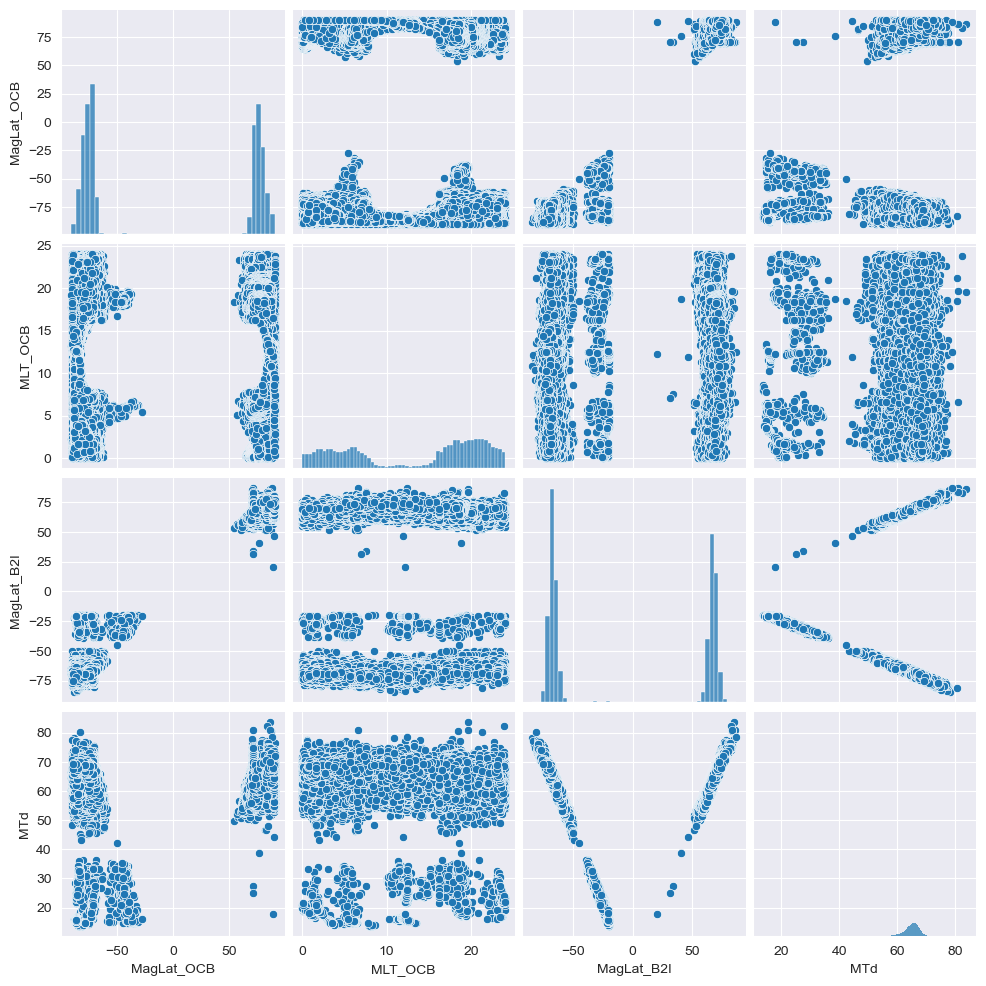

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(merged1_df[['MagLat_OCB', 'MLT_OCB', 'MagLat_B2I', 'MTd']])
plt.show()

In [75]:
bad = merged1_df['MagLat_OCB'] < 85             # Northern or Southern
AE_1 = merged1_df['1-H_AE'] < 9998
Bx = merged1_df['1AU_IP_BX,_GSE'] < 998
By = merged1_df['1AU_IP_BY,_GSE'] < 998
Bz = merged1_df['1AU_IP_BZ,_GSE'] < 998
PlasmaSpeed = merged1_df['1AU_IP_PLASMA_SPEED'] < 9998
proton = merged1_df['PROTON_QI'] < 9.998
mlt = merged1_df['MLT_OCB'] 

main_df = merged1_df[AE_1 & PlasmaSpeed & proton & mlt & bad]
main_df.describe()

,Date_UTC,MagLat_OCB,MLT_OCB,MagLat_B2I,MLT_B2I,"1AU_IP_BX,_GSE","1AU_IP_BY,_GSE","1AU_IP_BZ,_GSE",1AU_IP_PLASMA_SPEED,3-H_KP*10,1-H_DST,1-H_AE,1-H_AL-INDEX,AU-INDEX,PROTON_QI,Nightside,Dayside,MTd,1AU_IP_BY__GSM_nT,1AU_IP_BZ__GSM_nT
count,259756,259756.000000,259756.00000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.000000,259756.0,259756.0,259756.000000,259756.000000,259756.000000
mean,1999-05-03 06:27:06.331233920,-17.337234,13.38281,-15.440893,14.598228,-0.038446,0.092724,-0.111537,434.508839,20.238335,-14.091763,194.713720,-124.428298,70.003138,0.018822,1.0,0.0,64.667712,0.075846,-0.162410
min,1983-12-05 00:36:18,-89.970000,0.01000,-81.310000,0.000000,-32.900000,-32.600000,-25.500000,239.000000,0.000000,-289.000000,3.000000,-1803.000000,-220.000000,0.000100,1.0,0.0,13.654779,-24.800000,-29.000000
25%,1995-06-05 22:22:23,-76.220000,5.48000,-68.460000,6.410000,-2.600000,-2.500000,-1.400000,356.000000,10.000000,-22.000000,52.000000,-175.000000,23.000000,0.007800,1.0,0.0,63.515586,-2.400000,-1.600000
50%,1998-03-14 08:58:56,-71.020000,16.88000,-64.950000,18.180000,-0.100000,0.200000,-0.100000,408.000000,17.000000,-11.000000,118.000000,-66.000000,47.000000,0.012800,1.0,0.0,65.326652,0.100000,-0.100000
75%,2006-12-11 21:09:48,74.240000,20.12000,66.870000,20.330000,2.500000,2.600000,1.200000,494.000000,30.000000,-2.000000,272.000000,-24.000000,95.000000,0.021400,1.0,0.0,66.769270,2.500000,1.300000
max,2009-12-31 20:16:44,84.990000,24.00000,85.470000,24.000000,25.500000,34.800000,29.600000,1090.000000,87.000000,65.000000,2155.000000,18.000000,784.000000,0.860300,1.0,0.0,82.421095,33.000000,25.200000
std,NaN,73.879020,7.78447,65.915357,7.155339,3.517855,3.932975,2.767323,104.087318,13.575996,19.445684,200.085048,146.849995,67.134766,0.025568,0.0,0.0,4.341510,3.822814,2.915913


/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


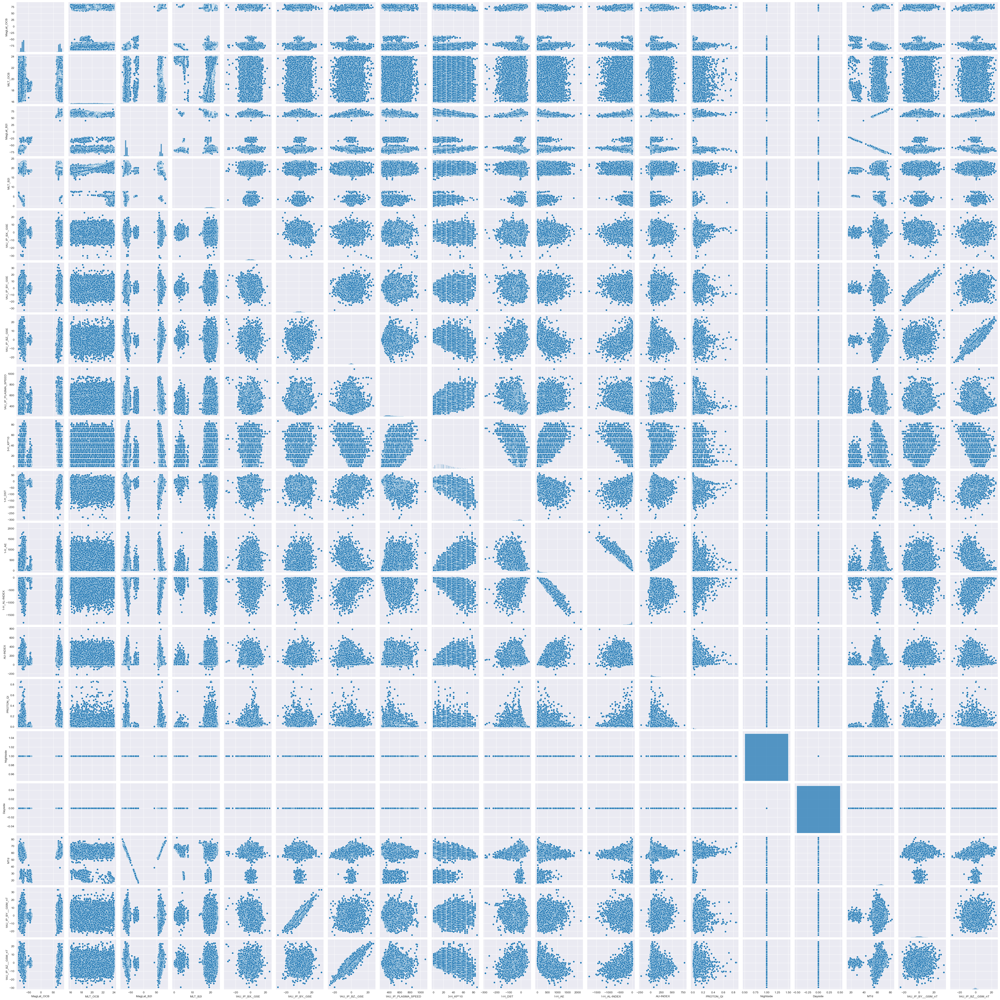

In [39]:
sns.pairplot(main_df)
plt.show()

In [44]:
# Getting rid of columns
main_df.drop('1AU_IP_BX,_GSE', axis=1, inplace=True)
main_df.drop('1AU_IP_BY,_GSE', axis=1, inplace=True)
main_df.drop('1AU_IP_BZ,_GSE', axis=1, inplace=True)
main_df.drop('Dayside', axis=1, inplace=True)
main_df.drop('Nightside', axis=1, inplace=True)
main_df.describe()

/var/folders/gg/qxtxkv2501v1x8qx_r4vgk_m0000gn/T/ipykernel_40865/675259711.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  main_df.drop('1AU_IP_BX,_GSE', axis=1, inplace=True)
/var/folders/gg/qxtxkv2501v1x8qx_r4vgk_m0000gn/T/ipykernel_40865/675259711.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  main_df.drop('1AU_IP_BY,_GSE', axis=1, inplace=True)
/var/folders/gg/qxtxkv2501v1x8qx_r4vgk_m0000gn/T/ipykernel_40865/675259711.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

,Date_UTC,MagLat_OCB,MLT_OCB,MagLat_B2I,MLT_B2I,1AU_IP_PLASMA_SPEED,3-H_KP*10,1-H_DST,1-H_AE,1-H_AL-INDEX,AU-INDEX,PROTON_QI,MTd,1AU_IP_BY__GSM_nT,1AU_IP_BZ__GSM_nT
count,144062,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000,144062.000000
mean,1999-01-17 20:43:19.250704640,-10.988304,19.787714,-10.034660,19.407732,435.809165,20.651206,-14.894768,202.262193,-129.943864,72.030299,0.018982,64.774009,0.090816,-0.254342
min,1983-12-05 00:48:09,-89.950000,16.010000,-81.310000,0.070000,251.000000,0.000000,-289.000000,3.000000,-1803.000000,-220.000000,0.000100,16.159365,-24.800000,-29.000000
25%,1995-05-26 21:33:53,-74.230000,17.950000,-67.430000,18.280000,357.000000,10.000000,-23.000000,54.000000,-184.000000,24.000000,0.007900,63.407729,-2.400000,-1.700000
50%,1998-01-25 21:55:32,-69.900000,19.780000,-63.790000,19.710000,410.000000,20.000000,-12.000000,124.000000,-71.000000,48.000000,0.012900,65.294983,0.100000,-0.200000
75%,2006-09-01 16:03:18.500000,73.900000,21.480000,66.670000,20.880000,496.000000,30.000000,-3.000000,285.000000,-25.000000,98.000000,0.021600,66.816531,2.500000,1.200000
max,2009-12-30 22:55:12,84.990000,24.000000,85.470000,23.920000,1090.000000,87.000000,65.000000,2155.000000,18.000000,784.000000,0.860300,82.421095,33.000000,25.200000
std,NaN,73.943204,2.152196,66.221276,2.706702,104.072818,13.739142,19.860537,205.911139,150.975256,69.143096,0.025744,3.738206,3.836774,2.898291


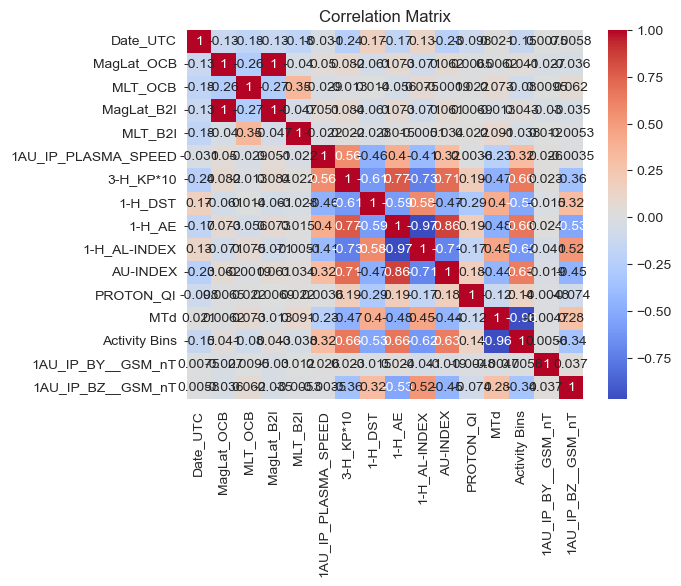

In [45]:
corr_matrix = main_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

Can see that most of the indices correlate with each other, however not much with Maglat OCB

### Feature Engineering
Here we will prepare the features to model OCB maglat

In [79]:
# Choosing Northern or Southern 
# # # # # # # # # # # # # # # # # # # #
#   Can Select any  Hemisphere        #
# # # # # # # # # # # # # # # # # # # #
Hemi = main_df['MagLat_OCB'] < 0
main2_df = main_df[Hemi]
### Features
X = main2_df.iloc[:,2:]

### the Target variable
y = main2_df['MagLat_OCB']

### Drop Nans
X = X.dropna()
y = y[X.index]

X.head(10)

,MLT_OCB,MagLat_B2I,MLT_B2I,"1AU_IP_BX,_GSE","1AU_IP_BY,_GSE","1AU_IP_BZ,_GSE",1AU_IP_PLASMA_SPEED,3-H_KP*10,1-H_DST,1-H_AE,1-H_AL-INDEX,AU-INDEX,PROTON_QI,Nightside,Dayside,MTd,Activity Bins,1AU_IP_BY__GSM_nT,1AU_IP_BZ__GSM_nT
180,18.76,-71.41,18.43,-6.2,7.7,-0.6,385.0,30.0,20.0,28.0,-8.0,18.0,0.0359,1,0,68.248173,1,7.7,-0.1
181,5.25,-69.19,5.82,-6.2,7.7,-0.6,385.0,30.0,20.0,28.0,-8.0,18.0,0.0359,1,0,64.407045,3,7.7,-0.1
182,17.60,-68.36,20.34,-5.0,7.8,1.5,393.0,30.0,17.0,55.0,-28.0,25.0,0.0301,1,0,67.049384,2,7.8,1.7
185,19.72,-68.27,19.14,-5.7,6.4,-2.8,397.0,30.0,12.0,160.0,-127.0,33.0,0.0313,1,0,65.856138,3,6.4,-2.9
187,4.63,-69.63,5.35,-5.7,6.4,-2.8,397.0,30.0,12.0,160.0,-127.0,33.0,0.0313,1,0,65.376416,3,6.4,-2.9
188,21.71,-63.86,21.76,-6.6,2.5,-5.7,396.0,33.0,-1.0,320.0,-260.0,59.0,0.0316,1,0,63.468808,4,2.1,-5.9
197,19.87,-65.38,19.26,-5.4,9.0,0.2,421.0,33.0,1.0,241.0,-149.0,91.0,0.0315,1,0,63.086777,4,8.9,-1.5
199,5.20,-68.43,5.83,-5.4,9.0,0.2,421.0,33.0,1.0,241.0,-149.0,91.0,0.0315,1,0,63.635831,4,8.9,-1.5
200,23.47,-63.27,23.27,-6.3,8.5,-0.3,428.0,30.0,1.0,297.0,-193.0,103.0,0.0307,1,0,63.267504,4,8.2,-2.3
203,18.91,-66.67,18.87,-7.0,7.9,-2.3,426.0,30.0,6.0,418.0,-252.0,164.0,0.0282,1,0,63.978041,4,6.9,-4.4


### Modeling

In [80]:
from sklearn.model_selection import train_test_split

# Split data (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display shapes
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")

### Standardizing Features
from sklearn.preprocessing import StandardScaler

# Initialize scaler
scaler = StandardScaler()

# Fit on training data and transform
X_train_scaled = scaler.fit_transform(X_train)

# Transform test data
X_test_scaled = scaler.transform(X_test)

X_train shape: (121156, 19)
X_test shape: (30290, 19)


### Linear Regression
Model

Linear Regression - MSE: 12.64, R2 Score: 0.41


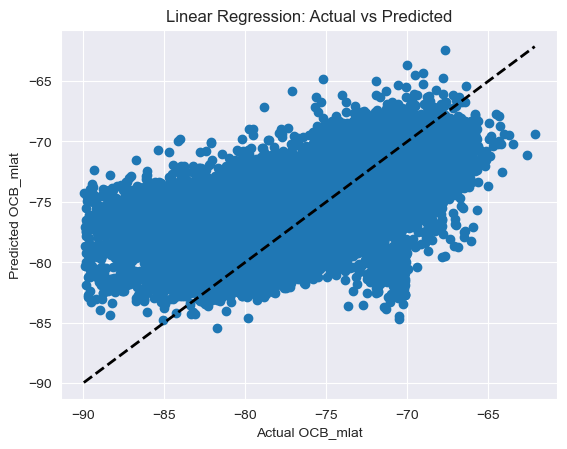

In [81]:
from sklearn.linear_model import LinearRegression

# Initialize model
lr_model = LinearRegression()

# Train the model
lr_model.fit(X_train_scaled, y_train)

from sklearn.metrics import mean_squared_error, r2_score

# Predict on test data
y_pred_lr = lr_model.predict(X_test_scaled)

# Calculate metrics
mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

print(f"Linear Regression - MSE: {mse_lr:.2f}, R2 Score: {r2_lr:.2f}")

### Visual
import matplotlib.pyplot as plt

# Plot actual vs predicted
plt.scatter(y_test, y_pred_lr)
plt.xlabel('Actual OCB_mlat')
plt.ylabel('Predicted OCB_mlat')
plt.title('Linear Regression: Actual vs Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

### Random Forest Regressor

Random Forest - MSE: 5.39, R2 Score: 0.75


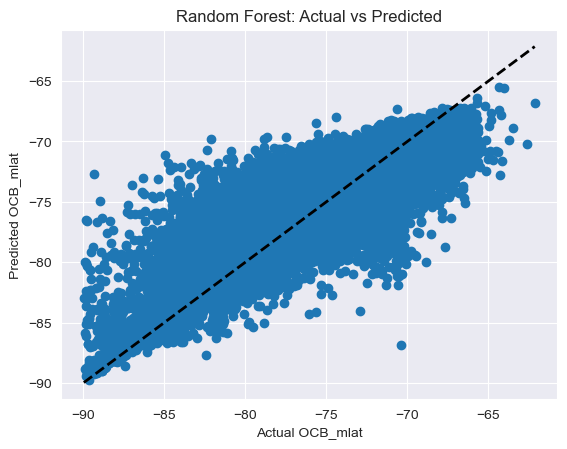

In [84]:
from sklearn.ensemble import RandomForestRegressor

# Initialize model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train_scaled, y_train)

# Predict on test data
y_pred_rf = rf_model.predict(X_test_scaled)

# Calculate metrics
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest - MSE: {mse_rf:.2f}, R2 Score: {r2_rf:.2f}")
# Plot actual vs predicted
plt.scatter(y_test, y_pred_rf)
plt.xlabel('Actual OCB_mlat')
plt.ylabel('Predicted OCB_mlat')
plt.title('Random Forest: Actual vs Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()


Random Forest - MSE: 5.39, R2 Score: 0.75


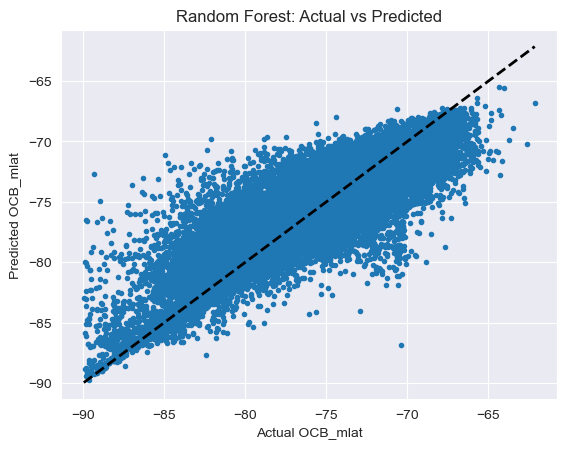

In [86]:
print(f"Random Forest - MSE: {mse_rf:.2f}, R2 Score: {r2_rf:.2f}")
# Plot actual vs predicted
plt.scatter(y_test, y_pred_rf, marker='.')
plt.xlabel('Actual OCB_mlat')
plt.ylabel('Predicted OCB_mlat')
plt.title('Random Forest: Actual vs Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

### Neural Network MLP Regressor

MLP Regressor - MSE: 5.75, R2 Score: 0.73


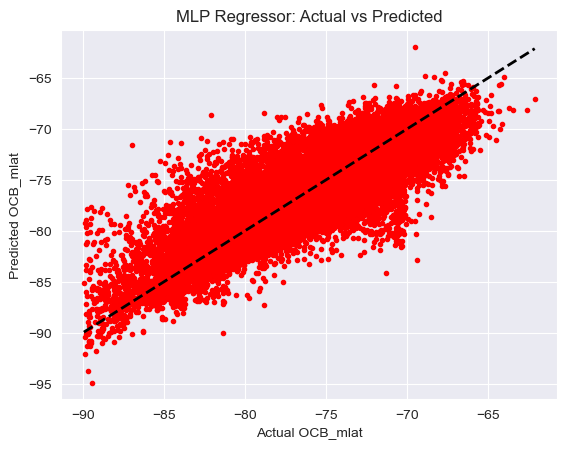

In [83]:
from sklearn.neural_network import MLPRegressor

# Initialize model
mlp_model = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)

# Train the model
mlp_model.fit(X_train_scaled, y_train)

# Predict on test data
y_pred_mlp = mlp_model.predict(X_test_scaled)

# Calculate metrics
mse_mlp = mean_squared_error(y_test, y_pred_mlp)
r2_mlp = r2_score(y_test, y_pred_mlp)

print(f"MLP Regressor - MSE: {mse_mlp:.2f}, R2 Score: {r2_mlp:.2f}")

# Plot actual vs predicted
plt.scatter(y_test, y_pred_mlp, marker='.', color='red')
plt.xlabel('Actual OCB_mlat')
plt.ylabel('Predicted OCB_mlat')
plt.title('MLP Regressor: Actual vs Predicted')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.show()

In [85]:
### Feature Extraction
from sklearn.inspection import permutation_importance

# Assuming you have an already trained MLP model named 'mlp_model'
# And your test set is X_test, y_test
result = permutation_importance(mlp_model, X_test, y_test, n_repeats=10, random_state=42)

# Display the importance of each feature
importance = result.importances_mean
for i, v in enumerate(importance):
    print(f"Feature: {X_test.columns[i]}, Importance: {v:.4f}")


/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(
/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(
/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(
/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(
/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(
/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has fe

Feature: MLT_OCB, Importance: 13452.0734
Feature: MagLat_B2I, Importance: -45.6588
Feature: MLT_B2I, Importance: 13767.8815
Feature: 1AU_IP_BX,_GSE, Importance: 1.8432
Feature: 1AU_IP_BY,_GSE, Importance: -14.7934
Feature: 1AU_IP_BZ,_GSE, Importance: -15.3405
Feature: 1AU_IP_PLASMA_SPEED, Importance: 2347.6612
Feature: 3-H_KP*10, Importance: -588.5557
Feature: 1-H_DST, Importance: 239.5392
Feature: 1-H_AE, Importance: 90848.1563
Feature: 1-H_AL-INDEX, Importance: 79413.0256
Feature: AU-INDEX, Importance: 5144.0819
Feature: PROTON_QI, Importance: -0.0626
Feature: Nightside, Importance: 0.0000
Feature: Dayside, Importance: 0.0000
Feature: MTd, Importance: 308.2610
Feature: Activity Bins, Importance: -9.7643
Feature: 1AU_IP_BY__GSM_nT, Importance: 0.2843
Feature: 1AU_IP_BZ__GSM_nT, Importance: 104.6035


/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/base.py:457: UserWarning: X has feature names, but MLPRegressor was fitted without feature names
  warnings.warn(


In [68]:
import numpy as np

# Access the weights of the first hidden layer
first_layer_weights = np.abs(mlp_model.coefs_[0])

# Compute the sum of the absolute weights for each input feature
feature_importance = np.sum(first_layer_weights, axis=1)

# Normalize the feature importance scores
feature_importance = feature_importance / np.sum(feature_importance)

# Display the importance of each feature
for i, v in enumerate(feature_importance):
    print(f"Feature: {X_train.columns[i]}, Importance: {v:.4f}")

Feature: MLT_OCB, Importance: 0.1410
Feature: MagLat_B2I, Importance: 0.0729
Feature: MLT_B2I, Importance: 0.1190
Feature: 1AU_IP_PLASMA_SPEED, Importance: 0.0642
Feature: 3-H_KP*10, Importance: 0.0631
Feature: 1-H_DST, Importance: 0.0526
Feature: 1-H_AE, Importance: 0.0620
Feature: 1-H_AL-INDEX, Importance: 0.0732
Feature: AU-INDEX, Importance: 0.0765
Feature: PROTON_QI, Importance: 0.0400
Feature: MTd, Importance: 0.0741
Feature: Activity Bins, Importance: 0.0528
Feature: 1AU_IP_BY__GSM_nT, Importance: 0.0572
Feature: 1AU_IP_BZ__GSM_nT, Importance: 0.0513


In [69]:
from sklearn.inspection import plot_partial_dependence

features = list(X_train.columns)
plot_partial_dependence(mlp_model, X_train, features, grid_resolution=20)
plt.show()

ImportError: cannot import name 'plot_partial_dependence' from 'sklearn.inspection' (/Users/beastxgamer/anaconda3/lib/python3.11/site-packages/sklearn/inspection/__init__.py)

### Inputing Predictions into the model
Fix this

In [ ]:
# Hypothetical test data
test_data = pd.DataFrame({
    'MLT_OCB': [23, 21],
    'MagLat_B2I': [63, 65],
    'MLT_B2I': [23, 21],
    'Proton_QI': [23, 21],
    '1AU_Plasma_SPEED': [23, 21],
    'GSM_X': [0.0, -0.1],
    'GSM_Y': [0.0, 0.1],
    'GSM_Z': [0.0, -0.1],
    'OCB_mlt': [10, 12],
    'dayside': [1, 1]
})

# Standardize test data
test_data_scaled = scaler.transform(test_data)

# Predict using Linear Regression
pred_lr = lr_model.predict(test_data_scaled)

# Predict using Random Forest
pred_rf = rf_model.predict(test_data_scaled)

# Predict using MLP Regressor
pred_mlp = mlp_model.predict(test_data_scaled)

# Display predictions
predictions = pd.DataFrame({
    'Feature1': test_data['Feature1'],
    'Feature2': test_data['Feature2'],
    'OCB_mlt': test_data['OCB_mlt'],
    'dayside': test_data['dayside'],
    'Pred_LR': pred_lr,
    'Pred_RF': pred_rf,
    'Pred_MLP': pred_mlp
})

print(predictions)